In [1]:
#import necessary Python libraries
import pandas as pd
import folium
import datetime
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt 

# read csv files
df1 = pd.read_csv('2020.csv') # the data is published on Kaggle  https://www.kaggle.com/datasets/onlyrohit/crimes-in-chicago
df2 = pd.read_csv('2021.csv')
df3 = pd.read_csv('2022.csv') 
pop = pd.read_excel('chicagopop.csv') # population of each community area on Wikipedia and the region they belong  https://en.wikipedia.org/wiki/Community_areas_in_Chicago

In [2]:
df1 = pd.concat([df1, df2], axis=0)  #concat all the dataframes of each year into 1 dataframe
df = pd.concat([df1, df3], axis=0)
 

#drop unecessary columns that we will not use
df = df.drop(columns=['Case Number','IUCR','Description', 'Beat', "District", "Ward", "FBI Code", "X Coordinate", "Y Coordinate", "Updated On",'Location'])
df = df.dropna()  #drop na values

In [3]:
df.head(3) #check that we can see the data

,ID,Date,Block,Primary Type,Location Description,Arrest,Domestic,Community Area,Year,Latitude,Longitude
0,12016034,01/01/2020 12:00:00 AM,018XX N WINNEBAGO AVE,DECEPTIVE PRACTICE,APARTMENT,False,False,22.0,2020,41.915306,-87.686639
1,12220321,01/01/2020 12:00:00 AM,091XX S DREXEL AVE,OFFENSE INVOLVING CHILDREN,RESIDENCE,False,True,47.0,2020,41.728192,-87.600985
2,12013828,01/01/2020 12:00:00 AM,044XX S LAVERGNE AVE,CRIMINAL SEXUAL ASSAULT,APARTMENT,False,False,56.0,2020,41.812274,-87.748177


In [4]:
pop.head(3)  #check that we can see the data

,Name,Population,Area
0,Rogers Park,55628,Far North Side
1,West Ridge,77122,Far North Side
2,Uptown,57182,Far North Side


In [5]:
#we observe that we can insert the community area number of each neighbourhood by reseting the index + 1 
pop = pop.reset_index()
pop.rename(columns={'index':'Community Area'}, inplace=True)

# increase the index of all rows by 1
pop['Community Area'] = pop['Community Area'] + 1

In [6]:
df = pd.merge(df, pop, on='Community Area', how='inner') #merge with pop, so all the data is in df dataframe

In [7]:
#Pivot table with the 'Area' as the index, and 'Primary Type' as the columns
table2 = df.pivot_table(index='Area', columns='Primary Type', values='ID', aggfunc='count')

# Fill any missing values with 0
table2.fillna(0, inplace=True)   #cluster with Primary Type and Area

C:\Users\chris\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\chris\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\chris\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\chris\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value 

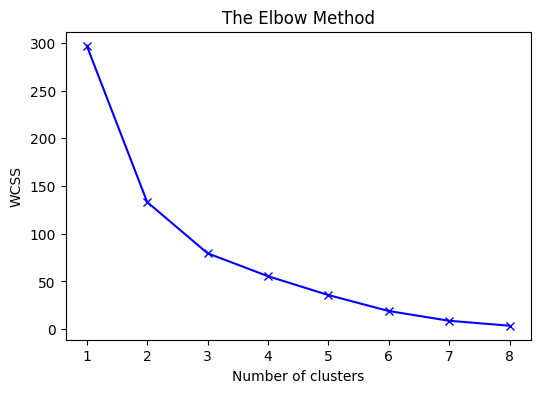

In [8]:
#implementing the elbow method
from sklearn import preprocessing 
df_standardized = preprocessing.scale(table2)
df_standardized = pd.DataFrame(df_standardized)
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(6,4))
wcss = []
for i in range (1, 9):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(df_standardized)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,9),wcss, 'bx-')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()  

C:\Users\chris\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Text(0.5, 0, 'Clusters')

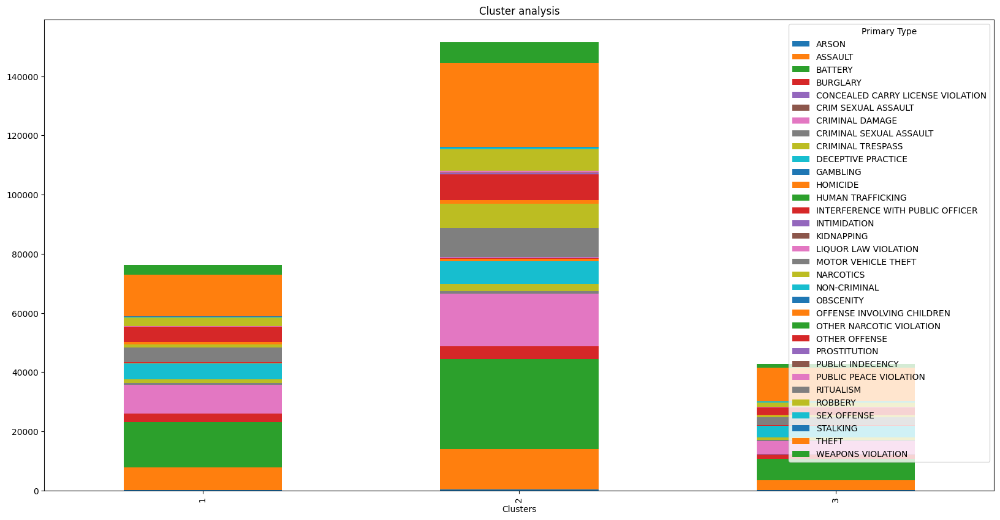

In [15]:
kmeans = KMeans(n_clusters = 3, init = 'k-means++',random_state = 42)  #clustering με 3 
y_kmeans = kmeans.fit_predict(df_standardized)
#beginning of the cluster numbering with 1 instead of 0 
y_kmeans1 = y_kmeans + 1

#list called cluster 
cluster = list(y_kmeans1)
#Adding cluster to our data set 
table2['cluster'] = cluster

#Mean of clusters 1 to 6 
kmeans_mean_cluster = pd.DataFrame(round(table2.groupby('cluster').mean(),1))
kmeans_mean_cluster.plot(kind='bar',stacked = True)
plt.rcParams["figure.figsize"] = (2,1)
plt.title("Cluster analysis")
plt.xlabel("Clusters")

In [10]:
#We will find which clusters belong in each cluster
table2[table2['cluster']==1]

Primary Type,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIM SEXUAL ASSAULT,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,...,PROSTITUTION,PUBLIC INDECENCY,PUBLIC PEACE VIOLATION,RITUALISM,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION,cluster
Area,,,,,,,,,,,,,,,,,,,,,
Far North Side,93.0,5346.0,11630.0,2624.0,149.0,12.0,7563.0,509.0,1740.0,7334.0,...,4.0,1.0,225.0,0.0,1866.0,424.0,133.0,17732.0,782.0,1
Far Southeast Side,250.0,10959.0,20927.0,4238.0,53.0,14.0,14139.0,508.0,1560.0,5018.0,...,21.0,2.0,281.0,0.0,3528.0,362.0,153.0,14166.0,5323.0,1
South Side,139.0,7090.0,13800.0,1925.0,32.0,9.0,7870.0,412.0,1043.0,3946.0,...,37.0,2.0,314.0,0.0,2711.0,263.0,129.0,12291.0,3222.0,1
Southwest Side,249.0,7354.0,14695.0,2658.0,108.0,4.0,9417.0,378.0,904.0,4782.0,...,115.0,2.0,266.0,0.0,2739.0,403.0,90.0,11793.0,3854.0,1


In [11]:
table2[table2['cluster']==2]

Primary Type,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIM SEXUAL ASSAULT,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,...,PROSTITUTION,PUBLIC INDECENCY,PUBLIC PEACE VIOLATION,RITUALISM,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION,cluster
Area,,,,,,,,,,,,,,,,,,,,,
West Side,443.0,13543.0,30383.0,4327.0,75.0,15.0,17668.0,939.0,2376.0,7689.0,...,460.0,5.0,715.0,1.0,7261.0,668.0,194.0,28195.0,7202.0,2


In [12]:
table2[table2['cluster']==3]

Primary Type,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIM SEXUAL ASSAULT,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,...,PROSTITUTION,PUBLIC INDECENCY,PUBLIC PEACE VIOLATION,RITUALISM,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION,cluster
Area,,,,,,,,,,,,,,,,,,,,,
Central,40.0,2595.0,6006.0,1128.0,17.0,7.0,2775.0,423.0,1418.0,4248.0,...,5.0,3.0,289.0,0.0,1589.0,232.0,52.0,15971.0,959.0,3
Far Southwest Side,124.0,5465.0,10674.0,2047.0,24.0,7.0,6941.0,272.0,894.0,3570.0,...,3.0,2.0,156.0,0.0,1813.0,202.0,67.0,7620.0,2795.0,3
North Side,65.0,2538.0,5350.0,2036.0,15.0,5.0,4107.0,274.0,948.0,4288.0,...,0.0,0.0,170.0,0.0,1645.0,231.0,71.0,14554.0,421.0,3
Northwest Side,99.0,3046.0,6498.0,1313.0,16.0,2.0,4145.0,201.0,575.0,3321.0,...,3.0,1.0,104.0,0.0,852.0,237.0,51.0,7105.0,1008.0,3


In [13]:
d = df.groupby(['Area','Primary Type']).size().reset_index().rename(columns={0:'Counts'})
d = d.sort_values(by=['Area','Counts'],ascending=False)
d = d.groupby('Area').head(3).sort_values(by=['Area','Counts'],ascending=False)
d

,Area,Primary Type,Counts
245,West Side,BATTERY,30383
274,West Side,THEFT,28195
249,West Side,CRIMINAL DAMAGE,17668
215,Southwest Side,BATTERY,14695
241,Southwest Side,THEFT,11793
219,Southwest Side,CRIMINAL DAMAGE,9417
184,South Side,BATTERY,13800
211,South Side,THEFT,12291
188,South Side,CRIMINAL DAMAGE,7870
180,Northwest Side,THEFT,7105


In [16]:
c = table2.copy()
c = c.reset_index(drop=False)
c = c[['Area','cluster']]
df_clusters = df.copy()
df_clusters = pd.merge(df_clusters, c, on='Area', how='inner')

In [17]:
#Create a Crime Map of Chicago using Plotly

#limit the data to a fraction of the original dataset
df_filtered = df_clusters.sample(frac=0.05) 
fig = px.scatter_mapbox(df_filtered, lat="Latitude", lon="Longitude", hover_name="Primary Type", color='cluster',color_continuous_scale= ['#009900', '#0000cc', '#cc0000'], hover_data=["Location Description", "Area" ,"Name","Arrest"], zoom=12, height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()
#plot the map to see how our clustering looks like 

In [18]:
df = df.loc[df['Latitude'] > 41]

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix  

# Processing Function for Features
def cart2polar(x, y):
    dist = np.sqrt(x**2 + y**2)
    phi = np.arctan2(y, x)
    return dist, phi


def preprocessFeatures(dfx):
    
    # Time Feature Engineering
    df = pd.get_dummies(dfx[['Area']])
    df['Hour_Min'] = pd.to_datetime(dfx['Date']).dt.hour + pd.to_datetime(dfx['Date']).dt.minute / 60
    # We add a feature that contains the expontential time
    df['Hour_Min_Exp'] = np.exp(df['Hour_Min'])
    
    df['Day'] = pd.to_datetime(dfx['Date']).dt.day
    df['Month'] = pd.to_datetime(dfx['Date']).dt.month
    df['Year'] = pd.to_datetime(dfx['Date']).dt.year

    month_one_hot_encoded = pd.get_dummies(pd.to_datetime(dfx['Date']).dt.month, prefix='Month')
    df = pd.concat([df, month_one_hot_encoded], axis=1, join="inner")
    
    # Convert Carthesian Coordinates to Polar Coordinates

    df['dist'], df['phi'] = cart2polar(dfx['Latitude'], dfx['Longitude'])
  

    return df



def encodeLabels(dfx):
    df = pd.DataFrame (columns = [])
    factor = pd.factorize(dfx['Primary Type'])
    return factor

In [20]:
df_filtered = df.sample(frac=1)  
factor = encodeLabels(df_filtered)
y_df = factor[0]
labels = list(factor[1])

In [21]:
# Create train_df & test_df
x_df = preprocessFeatures(df_filtered).copy()

# Split the data into x_train and y_train data sets
x_train, x_test, y_train, y_test = train_test_split(x_df, y_df, train_size=0.8, random_state=0)
x_train

,Area_Central,Area_Far North Side,Area_Far Southeast Side,Area_Far Southwest Side,Area_North Side,Area_Northwest Side,Area_South Side,Area_Southwest Side,Area_West Side,Hour_Min,...,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,dist,phi
215243,0,0,1,0,0,0,0,0,0,12.000000,...,0,0,0,0,1,0,0,0,97.038564,-1.125812
235840,0,1,0,0,0,0,0,0,0,10.000000,...,0,0,0,1,0,0,0,0,97.192611,-1.124169
484832,0,0,0,1,0,0,0,0,0,20.833333,...,0,0,1,0,0,0,0,0,97.075195,-1.126580
473361,0,0,0,0,0,1,0,0,0,10.800000,...,0,0,0,0,0,1,0,0,97.229673,-1.124686
75918,0,0,0,0,0,1,0,0,0,15.983333,...,0,0,0,1,0,0,0,0,97.264014,-1.125130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379263,0,0,0,0,0,0,1,0,0,2.966667,...,0,1,0,0,0,0,0,0,97.087166,-1.125819
111881,0,0,0,0,0,0,0,0,1,3.166667,...,1,0,0,0,0,0,0,0,97.212652,-1.125568
241472,0,0,1,0,0,0,0,0,0,15.000000,...,0,0,0,1,0,0,0,0,97.007030,-1.126120
303983,0,0,0,0,0,0,0,0,1,7.783333,...,0,1,0,0,0,0,0,0,97.204562,-1.125385


In [22]:
clf = RandomForestClassifier(max_depth=20, random_state=0, n_estimators = 100)
clf.fit(x_train, y_train.ravel())
y_pred = clf.predict(x_test)

results_log = classification_report(y_test, y_pred)
print(results_log)

C:\Users\chris\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\chris\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



              precision    recall  f1-score   support

           0       0.24      0.07      0.11      7944
           1       0.25      0.62      0.35     24018
           2       0.36      0.21      0.27      8868
           3       0.00      0.00      0.00       174
           4       0.32      0.60      0.42     25816
           5       0.16      0.01      0.02      7857
           6       0.21      0.07      0.11     15019
           7       0.30      0.02      0.03      4796
           8       0.41      0.21      0.28      2996
           9       0.41      0.05      0.08      4478
          10       0.16      0.01      0.03     11581
          11       0.25      0.02      0.03      5132
          12       0.13      0.01      0.02      1056
          13       0.14      0.01      0.01       803
          14       0.35      0.01      0.03      2200
          15       0.00      0.00      0.00         9
          16       0.93      0.35      0.50       156
          17       0.00    

C:\Users\chris\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [23]:
for i in range(len(y_pred)):
    print("True label:", y_test[i], "Predicted label:", y_pred[i])

True label: 4 Predicted label: 1
True label: 4 Predicted label: 1
True label: 8 Predicted label: 8
True label: 0 Predicted label: 6
True label: 4 Predicted label: 4
True label: 4 Predicted label: 4
True label: 9 Predicted label: 1
True label: 9 Predicted label: 4
True label: 1 Predicted label: 1
True label: 0 Predicted label: 1
True label: 13 Predicted label: 4
True label: 4 Predicted label: 2
True label: 1 Predicted label: 1
True label: 1 Predicted label: 6
True label: 2 Predicted label: 1
True label: 8 Predicted label: 6
True label: 0 Predicted label: 6
True label: 0 Predicted label: 1
True label: 5 Predicted label: 4
True label: 4 Predicted label: 1
True label: 4 Predicted label: 1
True label: 2 Predicted label: 2
True label: 4 Predicted label: 1
True label: 0 Predicted label: 6
True label: 6 Predicted label: 1
True label: 1 Predicted label: 6
True label: 11 Predicted label: 4
True label: 0 Predicted label: 1
True label: 4 Predicted label: 4
True label: 4 Predicted label: 1
True lab

True label: 2 Predicted label: 4
True label: 5 Predicted label: 1
True label: 6 Predicted label: 6
True label: 9 Predicted label: 4
True label: 6 Predicted label: 1
True label: 10 Predicted label: 4
True label: 23 Predicted label: 6
True label: 4 Predicted label: 2
True label: 10 Predicted label: 1
True label: 0 Predicted label: 1
True label: 1 Predicted label: 1
True label: 20 Predicted label: 4
True label: 10 Predicted label: 4
True label: 10 Predicted label: 1
True label: 6 Predicted label: 4
True label: 9 Predicted label: 4
True label: 2 Predicted label: 2
True label: 4 Predicted label: 1
True label: 4 Predicted label: 1
True label: 0 Predicted label: 1
True label: 4 Predicted label: 1
True label: 0 Predicted label: 6
True label: 10 Predicted label: 4
True label: 9 Predicted label: 4
True label: 8 Predicted label: 8
True label: 7 Predicted label: 4
True label: 2 Predicted label: 2
True label: 14 Predicted label: 1
True label: 6 Predicted label: 1
True label: 1 Predicted label: 1
Tr

True label: 4 Predicted label: 4
True label: 6 Predicted label: 1
True label: 10 Predicted label: 1
True label: 9 Predicted label: 4
True label: 6 Predicted label: 4
True label: 10 Predicted label: 1
True label: 1 Predicted label: 1
True label: 0 Predicted label: 1
True label: 6 Predicted label: 1
True label: 11 Predicted label: 1
True label: 1 Predicted label: 4
True label: 2 Predicted label: 4
True label: 7 Predicted label: 1
True label: 6 Predicted label: 1
True label: 1 Predicted label: 4
True label: 6 Predicted label: 4
True label: 14 Predicted label: 1
True label: 6 Predicted label: 9
True label: 1 Predicted label: 1
True label: 10 Predicted label: 4
True label: 2 Predicted label: 1
True label: 1 Predicted label: 4
True label: 10 Predicted label: 0
True label: 6 Predicted label: 4
True label: 10 Predicted label: 4
True label: 1 Predicted label: 1
True label: 4 Predicted label: 2
True label: 20 Predicted label: 6
True label: 1 Predicted label: 1
True label: 4 Predicted label: 1
Tr

True label: 6 Predicted label: 1
True label: 0 Predicted label: 4
True label: 5 Predicted label: 1
True label: 1 Predicted label: 4
True label: 10 Predicted label: 4
True label: 2 Predicted label: 2
True label: 4 Predicted label: 4
True label: 6 Predicted label: 1
True label: 22 Predicted label: 1
True label: 11 Predicted label: 1
True label: 0 Predicted label: 1
True label: 0 Predicted label: 2
True label: 4 Predicted label: 1
True label: 1 Predicted label: 1
True label: 6 Predicted label: 1
True label: 11 Predicted label: 1
True label: 4 Predicted label: 4
True label: 0 Predicted label: 1
True label: 7 Predicted label: 1
True label: 11 Predicted label: 6
True label: 4 Predicted label: 1
True label: 6 Predicted label: 6
True label: 14 Predicted label: 4
True label: 4 Predicted label: 1
True label: 15 Predicted label: 1
True label: 6 Predicted label: 1
True label: 7 Predicted label: 1
True label: 6 Predicted label: 4
True label: 11 Predicted label: 1
True label: 5 Predicted label: 1
Tr

True label: 8 Predicted label: 4
True label: 1 Predicted label: 4
True label: 1 Predicted label: 1
True label: 4 Predicted label: 4
True label: 4 Predicted label: 1
True label: 5 Predicted label: 1
True label: 4 Predicted label: 4
True label: 6 Predicted label: 2
True label: 9 Predicted label: 1
True label: 1 Predicted label: 1
True label: 14 Predicted label: 10
True label: 4 Predicted label: 4
True label: 6 Predicted label: 6
True label: 6 Predicted label: 4
True label: 1 Predicted label: 1
True label: 4 Predicted label: 6
True label: 1 Predicted label: 4
True label: 2 Predicted label: 4
True label: 0 Predicted label: 4
True label: 1 Predicted label: 4
True label: 21 Predicted label: 4
True label: 1 Predicted label: 1
True label: 6 Predicted label: 1
True label: 0 Predicted label: 4
True label: 6 Predicted label: 2
True label: 6 Predicted label: 1
True label: 2 Predicted label: 4
True label: 9 Predicted label: 1
True label: 2 Predicted label: 4
True label: 6 Predicted label: 1
True la

True label: 12 Predicted label: 4
True label: 8 Predicted label: 1
True label: 8 Predicted label: 0
True label: 10 Predicted label: 1
True label: 0 Predicted label: 6
True label: 1 Predicted label: 1
True label: 4 Predicted label: 4
True label: 5 Predicted label: 1
True label: 7 Predicted label: 11
True label: 2 Predicted label: 1
True label: 6 Predicted label: 1
True label: 2 Predicted label: 1
True label: 8 Predicted label: 8
True label: 1 Predicted label: 4
True label: 10 Predicted label: 2
True label: 6 Predicted label: 4
True label: 12 Predicted label: 1
True label: 13 Predicted label: 4
True label: 6 Predicted label: 4
True label: 1 Predicted label: 4
True label: 11 Predicted label: 4
True label: 10 Predicted label: 1
True label: 5 Predicted label: 4
True label: 1 Predicted label: 1
True label: 1 Predicted label: 1
True label: 2 Predicted label: 2
True label: 11 Predicted label: 4
True label: 21 Predicted label: 4
True label: 4 Predicted label: 4
True label: 9 Predicted label: 9


True label: 4 Predicted label: 4
True label: 6 Predicted label: 1
True label: 4 Predicted label: 4
True label: 8 Predicted label: 4
True label: 1 Predicted label: 4
True label: 1 Predicted label: 1
True label: 1 Predicted label: 1
True label: 0 Predicted label: 6
True label: 0 Predicted label: 1
True label: 1 Predicted label: 1
True label: 2 Predicted label: 4
True label: 6 Predicted label: 1
True label: 10 Predicted label: 4
True label: 4 Predicted label: 4
True label: 0 Predicted label: 1
True label: 6 Predicted label: 1
True label: 6 Predicted label: 1
True label: 4 Predicted label: 2
True label: 0 Predicted label: 1
True label: 6 Predicted label: 4
True label: 4 Predicted label: 2
True label: 2 Predicted label: 2
True label: 1 Predicted label: 14
True label: 0 Predicted label: 6
True label: 10 Predicted label: 4
True label: 4 Predicted label: 1
True label: 5 Predicted label: 1
True label: 11 Predicted label: 6
True label: 5 Predicted label: 4
True label: 10 Predicted label: 1
True 

True label: 1 Predicted label: 1
True label: 5 Predicted label: 1
True label: 1 Predicted label: 1
True label: 1 Predicted label: 1
True label: 5 Predicted label: 2
True label: 2 Predicted label: 4
True label: 8 Predicted label: 1
True label: 1 Predicted label: 1
True label: 2 Predicted label: 1
True label: 1 Predicted label: 1
True label: 4 Predicted label: 1
True label: 4 Predicted label: 4
True label: 4 Predicted label: 4
True label: 5 Predicted label: 1
True label: 2 Predicted label: 4
True label: 0 Predicted label: 1
True label: 10 Predicted label: 8
True label: 4 Predicted label: 4
True label: 5 Predicted label: 1
True label: 6 Predicted label: 4
True label: 1 Predicted label: 4
True label: 4 Predicted label: 6
True label: 6 Predicted label: 6
True label: 0 Predicted label: 4
True label: 7 Predicted label: 4
True label: 0 Predicted label: 6
True label: 6 Predicted label: 4
True label: 4 Predicted label: 4
True label: 7 Predicted label: 1
True label: 4 Predicted label: 4
True labe

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<AxesSubplot: xlabel='Predicted', ylabel='Actual'>

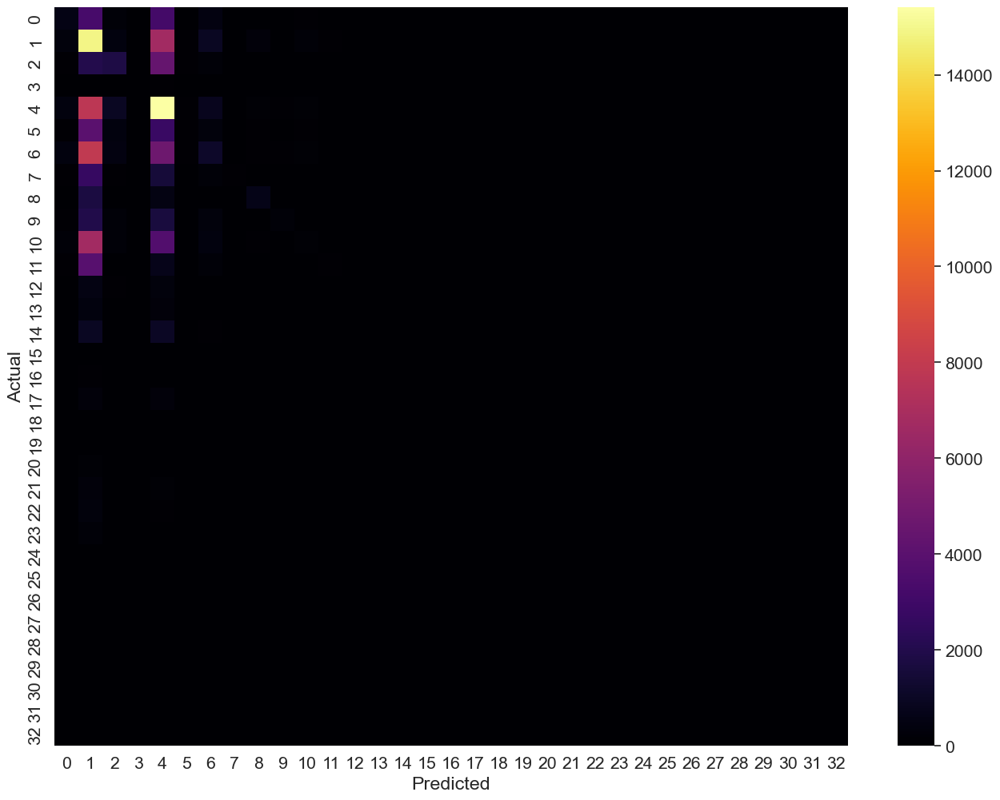

In [24]:
cnf_matrix = confusion_matrix(y_test.reshape(-1), y_pred)
df_cm = pd.DataFrame(cnf_matrix, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (16,12))
plt.tight_layout()
sns.set(font_scale=1.4) #for label size
sns.heatmap(df_cm, cbar=True, cmap= "inferno", annot=False, fmt='.0f')